### Figure S10 of Grund & Ritter (2020) , GJI


This Jupyter Notebook is part of our GJI paper and reproduces **Fig. S10** of the Supporting Information.

**Note**: since this notebook is a translation from a GMT shell script and some plotting options like roseplots are still in progress for PyGMT, the full figure (including the roseplot etc. shown in the paper) will be available in the near future! Stay tuned ;)

Feel free to modify or play around with the different parameters!

Packages required on your system:

* PyGMT, still under development (see https://www.pygmt.org/dev/overview.html)
* pandas
* numpy
* matplotlib

author: M. Grund (2020-07-23)

In [1]:
import numpy as np
import pandas as pd
import os
from math import pi
import matplotlib.pyplot as plt
import pygmt

#### Generate colorwheel and save as eps file

Before we plot the map, first we create the required colorwheel and save it as eps file which then can be directly read in by PyGMT's `image` function later. 

The following code is a python port of my original MATLAB function `make_colorwheel`
 available from https://de.mathworks.com/matlabcentral/fileexchange/73882. It uses the cyclic colormaps of Fabio Crameri which you should download from here http://www.fabiocrameri.ch/cycliccolourmaps.php before running this notebook. After unzipping place the colormap files in your working directory.

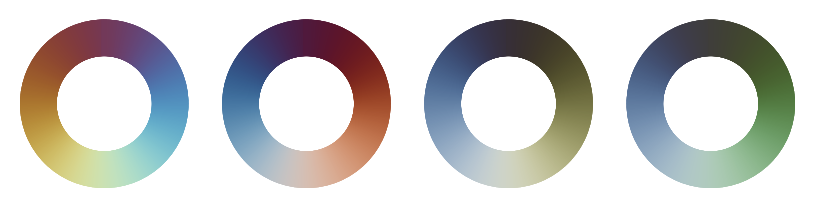

In [2]:
def make_colorwheelPy(cmap, fformat):
    
    # load colormap from text file
    cmap2use = np.loadtxt(cmap)

    # interpolate cmap2use to go from 0 to 360 degrees (full circle)
    cindex = np.linspace(0, 255, 360)
    c1 = np.interp(cindex, np.arange(0, 256), cmap2use[:, 0])
    c2 = np.interp(cindex, np.arange(0, 256), cmap2use[:, 1])
    c3 = np.interp(cindex, np.arange(0, 256), cmap2use[:, 2])

    cmapa = [c1 ,c2, c3] 

    # define plotting range
    theta = np.linspace(.5 * pi, 2.5 * pi, 360)
    rho = ([1.22, 2])

    # plot in polar projection, loop over the whole range 0 to 360 degrees
    for ii in range(360):
        plt.polar([theta[ii], theta[ii]], 
                  rho, 
                  color = [cmapa[0][ii], cmapa[1][ii], cmapa[2][ii]], 
                  linewidth = 2)
    
    # remove axis including all annotations
    plt.axis('off')
    
    # files are saved in specified format for later usage in PyGMT (see below),
    # the save name corresponds to the input file name except the format ending
    # face and edgecolor are set to be transparent/not appearing
    plt.savefig('PLOT_colorwheel_' + cmap.rsplit('.', 1)[0] + '.' + fformat, 
                bbox_inches = 'tight', dpi = 300, figsize = (150, 150),
                facecolor = fig.get_facecolor(), edgecolor = 'none')

# plot colorwheels based on four different colormaps
# in the following we use the romaO colormap
fformat = 'eps'
fig = plt.figure(figsize = (5, 5), dpi = 200)
ax1 = plt.subplot(141, projection = 'polar')
make_colorwheelPy('romaO.txt', fformat)
ax2 = plt.subplot(142, projection = 'polar')
make_colorwheelPy('vikO.txt', fformat)
ax3 = plt.subplot(143, projection = 'polar')
make_colorwheelPy('brocO.txt', fformat)
ax4 = plt.subplot(144, projection = 'polar')
make_colorwheelPy('corkO.txt', fformat)

#### Create the map

Now let's start with the map. First, we create a new pygmt figure object and define some parameters for plotting (for full list see http://gmt.soest.hawaii.edu/doc/latest/gmt.conf.html).

In [2]:
# create figure object
fig = pygmt.Figure()

In [3]:
# define parameters for plotting
pygmt.config(PROJ_LENGTH_UNIT ='c',
             COLOR_BACKGROUND = 'green',
             MAP_LABEL_OFFSET = '5.5p',
             MAP_GRID_PEN_PRIMARY = '0.3p,dimgrey',
             MAP_ANNOT_OFFSET_PRIMARY = '5p',
             MAP_ANNOT_OFFSET_SECONDARY = '5p', 
             MAP_ANNOT_OBLIQUE = '30',
             MAP_FRAME_TYPE = 'fancy',
             MAP_FRAME_WIDTH = '2p',
             MAP_FRAME_PEN = '1.1p',
             MAP_TICK_LENGTH_PRIMARY = '5p',   
             FONT_ANNOT_PRIMARY = '8p,Helvetica', 
             FONT_LABEL = '8p')  

Next we define the map content and plot an elevation grid as background using the `grdimage` function.
* Here we can directly access the elevation grid via PyGMT by defining the desired resolution (`'@earth_relief_01m'`, corresponds to ETOPO1 data). Afterwards the required grid of the area is automatically extracted based on the defined region limits (`region = [3.5, 36.5, 54, 71.5]`). The first time you access an elevation grid file it will be downloaded from the GMT server and stored under your GMT user directory. Then the grid file is read from there. For further details see http://gmt.soest.hawaii.edu/doc/latest/datasets.html.
* We use an Albers conic equal-area projection via `projection = 'l20/60/16/80/1:10000000'`.
* The background is colored by using the colormap `gray.cpt` and shading is set to `True`.

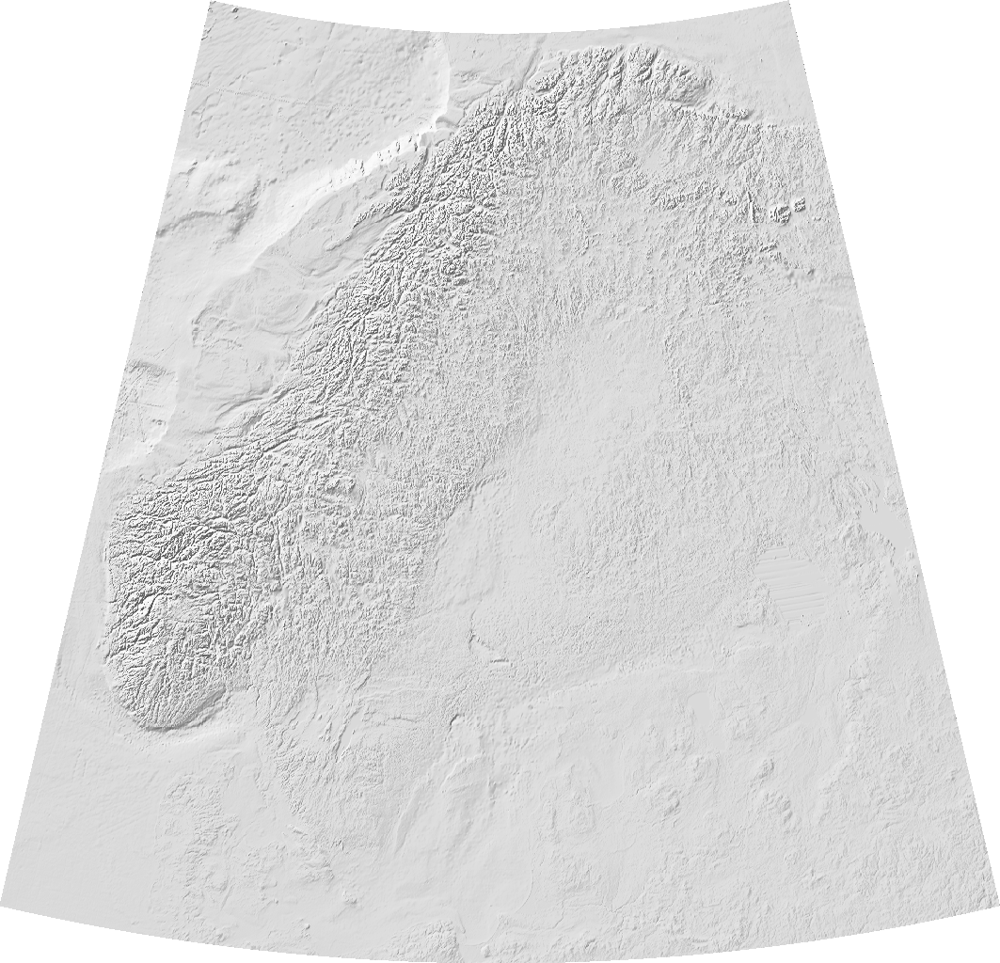

In [4]:
fig.grdimage('@earth_relief_01m',  
             region = [3.5, 36.5, 54, 71.5], 
             projection = 'l20/60/16/80/1:10000000',
             shading = True,
             cmap = 'gray.cpt')

# set the resolution of the figures that are displayed in the notebook below (reduces file size),
# in the end the figure is saved in pdf format in full resolution
dpifig = 150
fig.show(dpi = dpifig)

Now let's use the `coast` function to
* plot high resolution shorelines (`resolution = 'h'`) in black on top (`'1/0.5p,black'`)
* color oceans and water areas in white (`water = 'white'`)
* fill lakes in lightgray via `C = 'lightgray'` (so they are not clearly visible)
* add a fancy map frame with annotations every 5°'s in latitude and longitude direction (`frame = [5, 5]`)
* add a map scale in the lower right corner

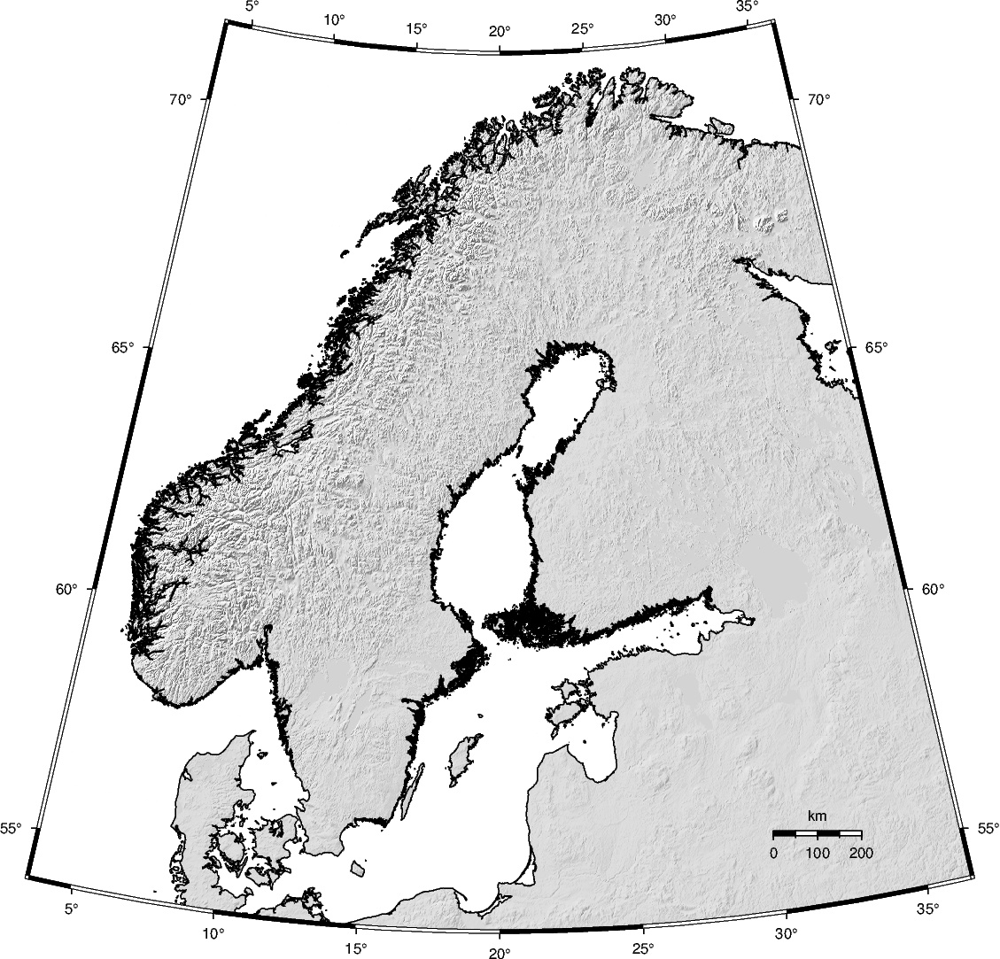

In [5]:
fig.coast(resolution = 'h', 
          shorelines = '1/0.5p,black', 
          water = 'white',
          C = 'lightgray', 
          frame = [5, 5],
          map_scale = 'f31.5/55.5/56/200+lkm+jt')

fig.show(dpi = dpifig)

Next, let's add some tectonic content to the map (inferred paleo-subduction zones, shear zones).

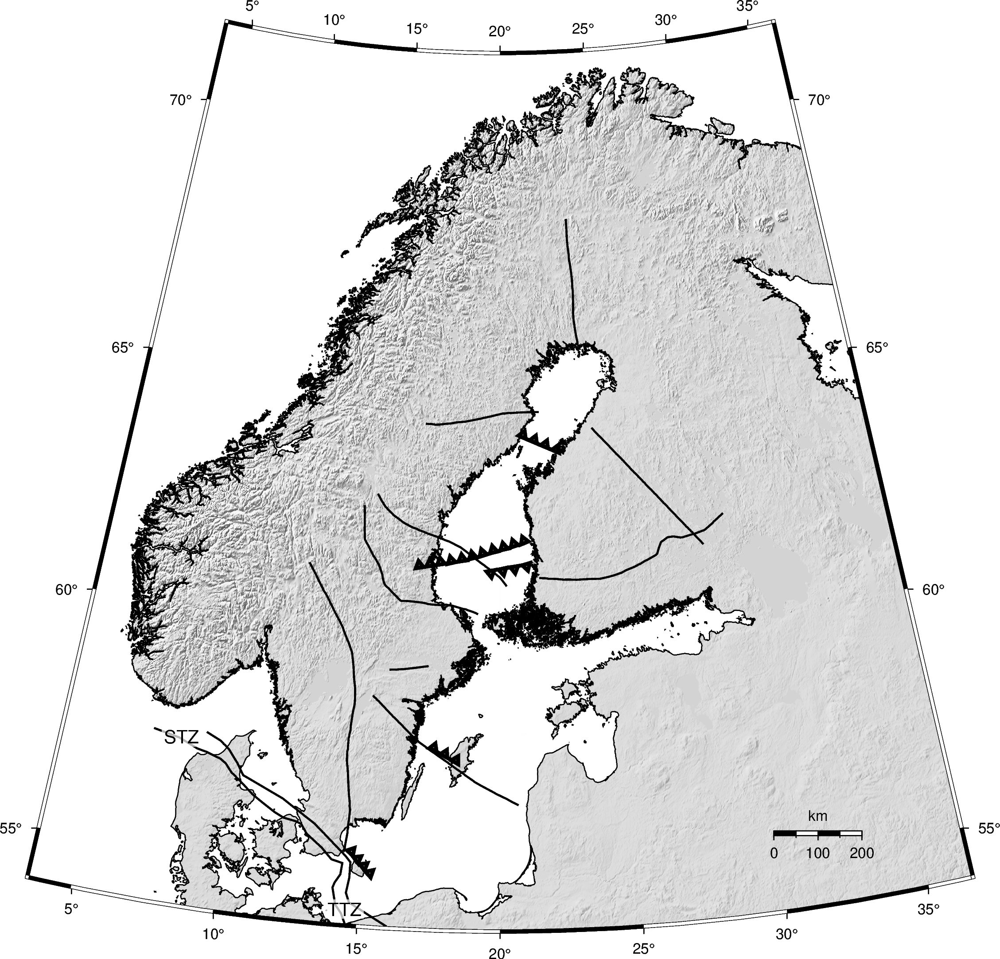

In [6]:
# read in file using pandas
filein2 = 'scan_shear_zones.dat'
namescol2 = ['lon', 'lat', 'name']
datatab2 = pd.read_table(filein2, 
                         delim_whitespace = True, 
                         skiprows = 5, 
                         names = namescol2)

# get single names of individual structures to plot
names = list(set(datatab2['name']))
namescl = [x for x in names if str(x) != 'nan']

for name in namescl: # go through the different names 
    tabfilt21 = datatab2[(datatab2['name'] == name)].copy()
    
    tabfilt21['lon'] = tabfilt21['lon'].astype(float) # convert to float
    lons = tabfilt21['lon']
    lats = tabfilt21['lat']
    
    # first distinguish between shear zones and subduction zones
    if name.startswith('Shear'):
        fig.plot(x = lons, 
                 y = lats, 
                 pen = '1p,black')
    else:
        
        # now distinguish in which direction ((l)eft or (r)ight) sawtooth pattern should be plotted
        if name.endswith('r'):    
            fig.plot(x = lons, 
                     y = lats, 
                     style = 'f0.2/0.15+t+r', 
                     pen = '2p,black')
        else:
            fig.plot(x = lons, 
                     y = lats, 
                     style = 'f0.2/0.15+t+l', 
                     pen = '2p,black')
    
# read in file using pandas, we can use the columnnames from above here 
filein3 = 'scan_STZ.dat'
datatab3 = pd.read_table(filein3, 
                         delim_whitespace = True, 
                         skiprows = 3, 
                         names = namescol2)

# get single names of individual structures to plot
names2 = list(set(datatab3['name']))
namescl2 = [x for x in names2 if str(x) != 'nan']  
   
# plot the Tornquist zone in firebrick red color    
for name in namescl2:   
    tabfilt31 = datatab3[(datatab3['name'] == name)].copy()
    
    tabfilt31['lon'] = tabfilt31['lon'].astype(float) # convert to float
    lons = tabfilt31['lon']
    lats = tabfilt31['lat']
    
    fig.plot(x = lons, 
             y = lats, 
             pen = '1p,black')

# STZ/TTZ
textsize = '10p'
textcol = 'black'

fig.text(x = 7.9, 
         y = 57.4 , 
         text = 'STZ', 
         font = textsize + ',' + 
         textcol,G = 'white@30')

fig.text(x = 14.55, 
         y = 54.3 , 
         text = 'TTZ', 
         font = textsize + ',' + 
         textcol,G = 'white@30')

fig.show()

Before plotting the individual nulls, first we preprocess the data using pandas.

In [7]:
# file containing all null measurements
filein = '00_res_nulls_good_fair.dat'
# define columnnames
namescol = ['lon', 'lat', 'dtmod', 'val', 'y', 'baz', 'evlon', 'evlat']
tabn = pd.read_table(filein, 
                     delim_whitespace = True, 
                     names = namescol)

# rearange columns to fit for plotting function when using rotated rectangles
# direction (in degrees counter-clockwise from north), x-dimension, and y-dimension must be 
# found in columns 3, 4, and 5
coltitles = ['lon', 'lat', 'baz', 'dtmod', 'y', 'val', 'evlon', 'evlat']
tabn = tabn.reindex(columns = coltitles)

# fix length and width of bars
tabn['dtmod'] = 80
tabn['y'] = 10

# write to new file since pygmt cannot accept the whole pandas dataframe as input
tabn.to_csv('splitting_GR2020_nulls.dat', 
           header = None, 
           index = None, 
           sep = ' ', 
           mode = 'w')

# add 90 degrees to each baz value (to get perpendicular direction of baz) and save again
tabn['baz'] = tabn['baz'] + 90
tabn.to_csv('splitting_GR2020_nulls_perp.dat', 
           header = None, 
           index = None, 
           sep = ' ', 
           mode = 'w')

Now we plot all null measurements included in the files `splitting_GR2020_nulls.dat` and `splitting_GR2020_nulls_perp.dat` as black bars with white edges which are oriented parallel and perpendicular to the corresponding backazimuth directions.

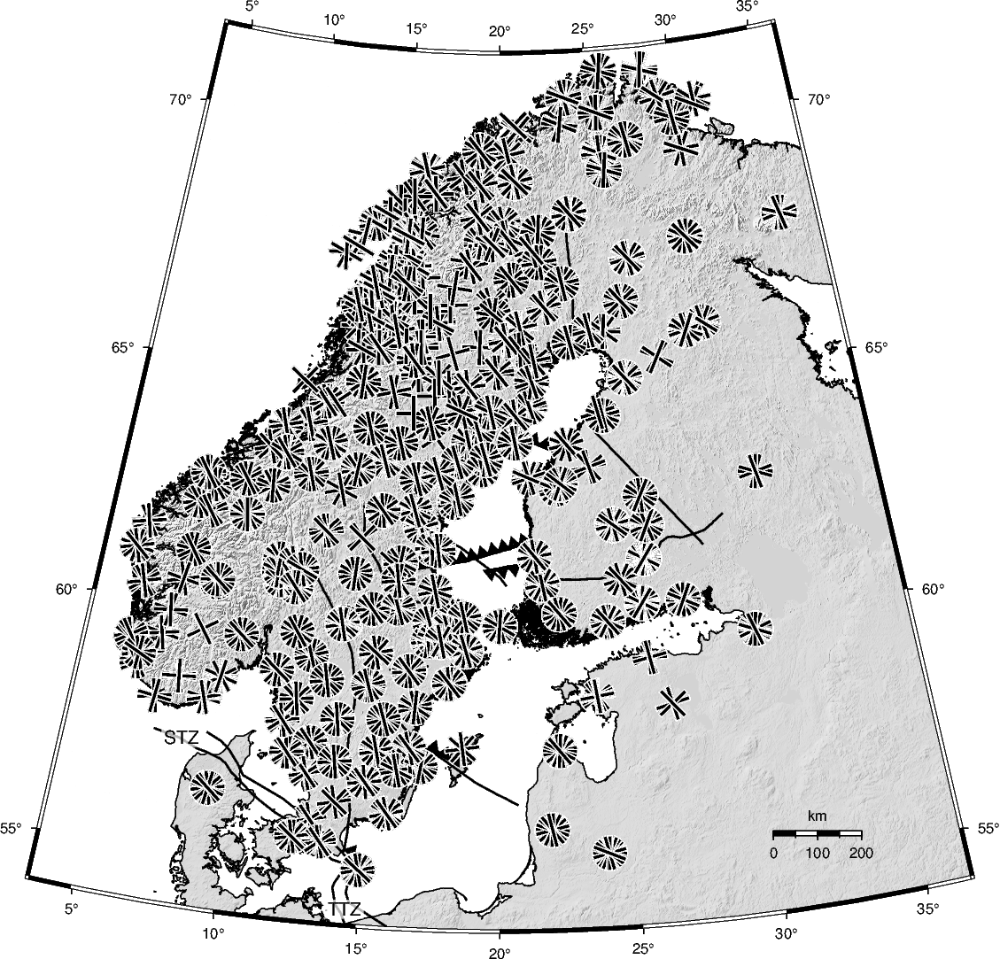

In [8]:
# using rotated rectangles colored black with white edges
bar_edgecol = 'white'
fig.plot(data = 'splitting_GR2020_nulls.dat', 
         style = 'J', 
         pen ='0.35p,' + bar_edgecol , 
         color = 'black')

fig.plot(data = 'splitting_GR2020_nulls_perp.dat', 
         style = 'J', 
         pen ='0.35p,' + bar_edgecol , 
         color = 'black')

fig.show(dpi = dpifig)

Before plotting the individual splitting bars, first we again preprocess the data using pandas.

In [9]:
# file containing all splitting measurements
filein = '00_res_splits_good_fair.dat'
# define columnnames
namescol = ['lon', 'lat', 'dtmod', 'val', 'y', 'phi', 'evlon', 'evlat']
tabs = pd.read_table(filein, 
                     delim_whitespace = True, 
                     names = namescol)

# rearange columns to fit for plotting function when using rotated rectangles
# direction (in degrees counter-clockwise from north), x-dimension, and y-dimension must be 
# found in columns 3, 4, and 5
coltitles = ['lon', 'lat', 'phi', 'dtmod', 'y', 'val', 'evlon', 'evlat']
tabs = tabs.reindex(columns = coltitles)

# write to new file since pygmt cannot accept the whole pandas dataframe as input
tabs.to_csv('splitting_GR2020.dat', 
           header = None, 
           index = None, 
           sep = ' ', 
           mode = 'w')

Now we 
* plot the individual splitting results included in file `splitting_GR2020.txt` as rotated rectangles. For coloring we use the same colormap as used for generating the colorwheel above (`romaO`) to show the source region corresponding to the individual splitting measurements.
* finally, we place black dots on top to mark the station locations

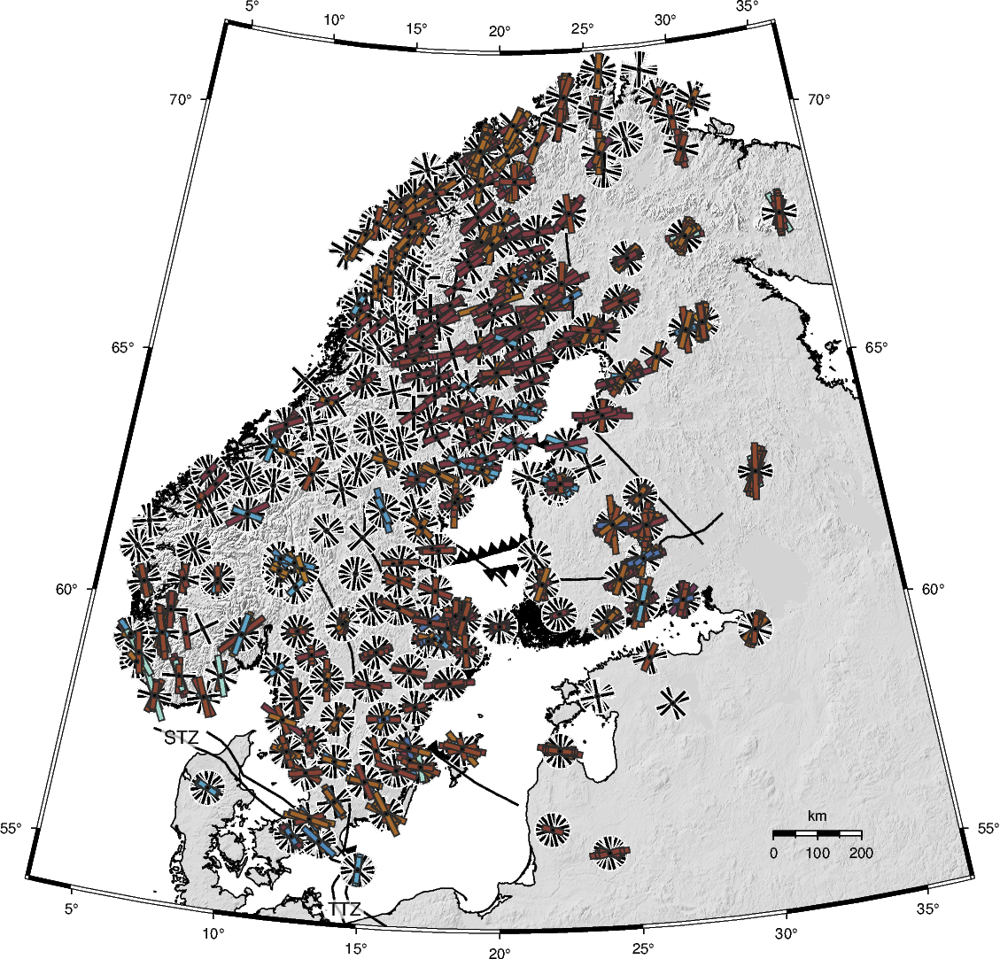

In [10]:
# generate colormap for values between 0 and 360 degrees
pygmt.makecpt(cmap = 'romaO', 
              T = [0 ,360 , 1], 
              reverse = False, 
              output = 'cmapmod.cpt')

# using rotated rectangles color-coded by the source regions (based on the colorwheel)
bar_edgecol = '44/44/44'
fig.plot(data = 'splitting_GR2020.dat', 
         style = 'J', 
         pen ='0.55p,' + bar_edgecol , 
         color = 'red', 
         cmap = 'cmapmod.cpt')

# plot black dots on top to mark station locations (use split and null data)
fig.plot(data = 'splitting_GR2020.dat', 
         style = 'c0.08c', 
         pen ='thinner,' + bar_edgecol, 
         color = 'black')

fig.plot(data = 'splitting_GR2020_nulls.dat', 
         style = 'c0.08c', 
         pen ='thinner,' + bar_edgecol, 
         color = 'black')

fig.show(dpi = dpifig)

In [11]:
### TODO legend and roseplot
# plot somewhere outside of frame or "beneath" the legend box, only needed to define the legend  label
#bar_edgecol = 'black'
#bar_fillcol = 'lightgray'
#fig.plot(data = 'legend_file.txt', style = 'J', pen ='0.55p,' + bar_edgecol , color = bar_fillcol, 
#         label = '2s')

## define parameters for plotting
#with pygmt.config(MAP_LABEL_OFFSET = '15.5p',
#             MAP_ANNOT_OFFSET_PRIMARY = '15p',
#             MAP_ANNOT_OFFSET_SECONDARY = '15p'):  

#    fig.legend(position = 'JBR+jBR+w2i/1i+o10.3c', box='+gwhite+p1.5p,black')

#fig.show(dpi = dpifig)

Now we add a new equidistant map in the upper left corner.

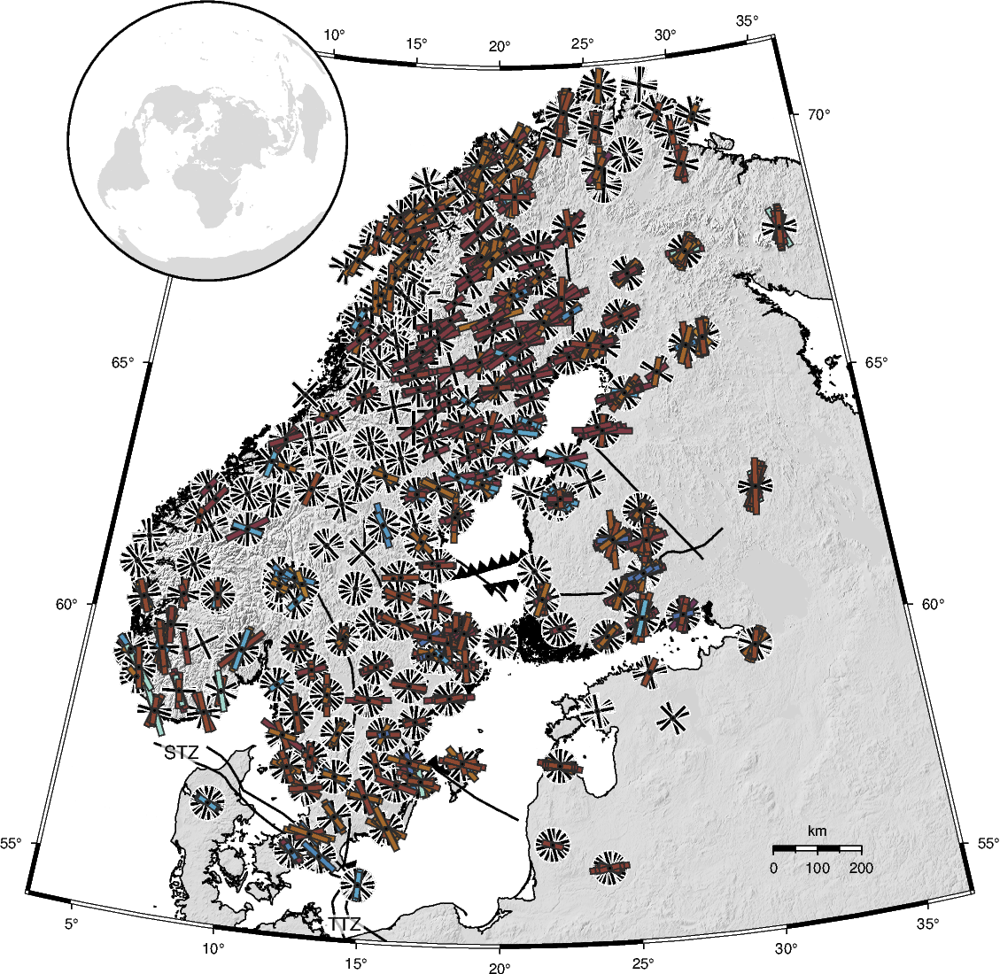

In [12]:
# shift new map in x and y dirs
fig.shift_origin(xshift = '0.29i', 
                 yshift = '5i')

# center of map
centerN = 65 # latitude in degrees
centerE = 20 # longitude in degrees

colfill = '217.6/217.6/217.6'
fig.coast(region='g', 
          projection = 'E' + str(centerE) + '/'+ str(centerN) + '/160/2.1i', 
          resolution = 'c', 
          land = colfill, 
          shorelines ='1/0.1p,' + colfill, 
          C = colfill, 
          frame = True)

fig.show(dpi = dpifig)

We take the colorwheel eps-file generated above and manually center it on the equidistant map.

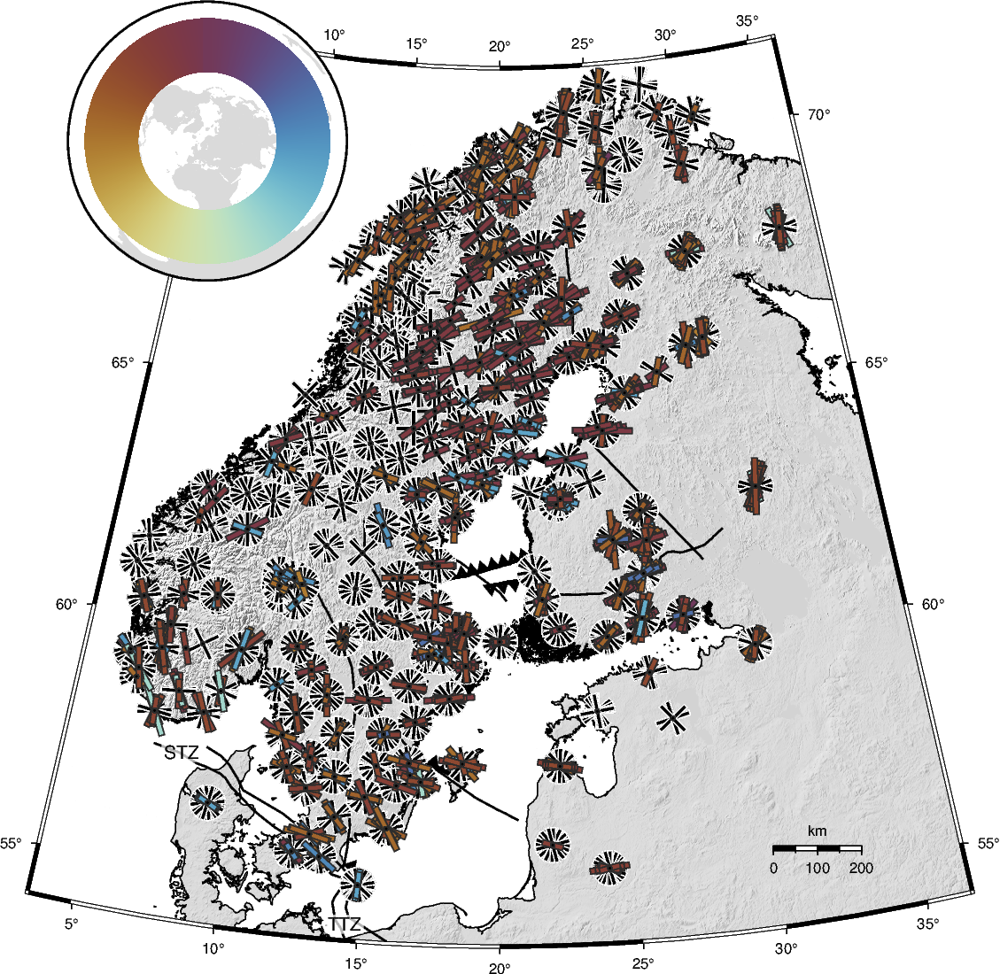

In [13]:
# manually place/adjust the colorwheel to the center of the map
lon_im = -21.005
lat_im = -27.97
fig.image('PLOT_colorwheel_romaO.eps', 
          D = 'x' + str(lon_im) + '/' + str(lat_im) + '+w21.93i/21.93i')

fig.show(dpi = dpifig)

Next we 

* plot the plate boundaries after **_Bird (2003)_** in light red
* plot dashed circles at distance of 80° and 140° distance 
* add annotations to the circles

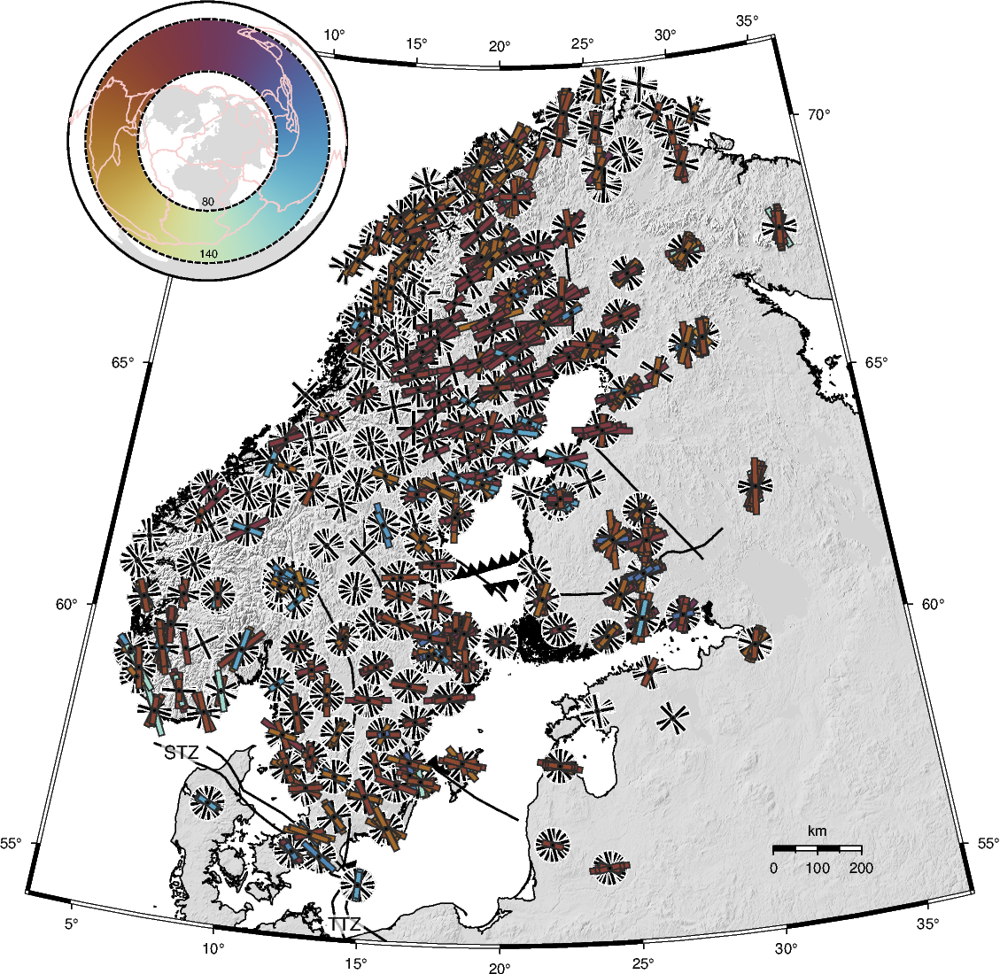

In [14]:
# plot circles at 80 and 140 degrees distance, use here twice the value since GMT expects the diameter
# plot first in white to overlay possible irregularities from a not perfectly aligned colorwheel
distlims = [80,140]

for dists in distlims:
    fig.plot(x = centerE, 
             y = centerN, 
             style ='E-' + str(2 * dists) + 'd', 
             pen ='0.9p,white')

# plot plate boundaries atop the colorwheel
plbfile = 'pb2003_GMTready.txt'
plbcol = '245.76/204.8/204.8'
fig.plot(data = plbfile, 
         pen = '0.5p,' + plbcol)

# now plot circles at 80 and 140 degrees distance in dashed black on top again, 
# 3_1:0p generates smaller distances between dash lines
for dists in distlims:
    fig.plot(x = centerE, 
             y = centerN, 
             style ='E-' + str(2 * dists) + 'd', 
             pen ='0.9p,black,3_1:0p')

# add annotations to circles
fig.text(x = -lon_im, 
         y = -4.5, 
         text = '80', 
         font='6p')

fig.text(x = -lon_im, 
         y = -64, 
         text = '140', 
         font='6p')

fig.show(dpi = dpifig)

In a next step we 
* plot the event locations
* connect the locations with the center of the map
* add a triangle as network marker in the center of the equidistant map

In [18]:
# drop all columns except the event location coordinates
tabs.drop(tabs.columns.difference(['evlon','evlat']), 1, inplace = True)
tabn.drop(tabn.columns.difference(['evlon','evlat']), 1, inplace = True)
# remove duplicate rows
tabs = tabs.drop_duplicates(keep = False) 
tabn = tabn.drop_duplicates(keep = False) 

tabs['evlat'][1]

KeyError: 1

In [16]:
# plot great circle paths to network center, use tabs (splits) and tabn (nulls) from above
raycol = '99/99/99'

for i in range(0,len(tabs)):
    fig.plot(x = [tabs['evlat'][i],centerE],
             y = [tabs['evlon'][i],centerN],
             pen = raycol,
             t = '85')
   
for i in range(0,len(tabn)):
    fig.plot(x = [tabn['evlat'][i],centerE],
             y = [tabn['evlon'][i],centerN],
             pen = raycol,
             t = '85')        

# plot event locations in equidistant map (splits)
fig.plot(x = tabs['evlat'],
         y = tabs['evlon'],
         style = 'c0.06i',
         color = 'darkgray',
         pen = '0.45')

# plot event locations in equidistant map (nulls)
fig.plot(x = tabn['evlat'],
         y = tabn['evlon'],
         style = 'c0.06i',
         color = 'darkgray',
         pen = '0.45')

# plot station marker 
fig.plot(x = centerE,
         y = centerN, 
         color = '205/0/0', 
         style = 't0.25c', 
         pen ='black')

fig.show(dpi = dpifig)

KeyError: 1

Finally save the figure in pdf format with a resolution of 300 dpi.

In [ ]:
fig.savefig('PLOT_figs10.pdf', dpi = 300)

### References

* Bird (2003), An updated digital model of plate boundaries, Geochemistry Geophysics Geosystems, 4(3), 1027, <https://doi.org/10.1029/2001GC000252>.